# ASSIGNMENT 1: Weakly interacting and confined bosons at low density

## Introduction

Given N identical bosons trapped in a harmonic potential at temperatures near 0K with a contact interaction between particles, the system can be described in a very good aproximation by the Gross-Pitaevskii Equation. Assuming that all particles occupy the same monoparticular state, the equation describes how the best single-particle state to describe the N particles behaves, and in harmonic oscilator units, the equation reads:
$$\bar{\mu}\overline{\Psi}(\vec{r_{1}})= \left[ -\frac{1}{2}\nabla^{2} + \frac{1}{2}r^{2}_{1} +4\pi\overline{a}_s N|\overline{\Psi}(\vec{r_{1}})|^{2}\right]\overline{\Psi}(\vec{r_{1}}),   $$

where $\overline{\Psi}(\vec{r_{1}})$ is the single-particle state that the N bosons share, that is normalized to 1, $\overline{a}_s$ is the interactin and $\mu$ the chemical potential.

For this expression, it must be assumed that $ N  \approx N-1$, that all bosons are in the same monoparticular state and that the interaction term can be described as $V(|\vec{r_1}-\vec{r_2}|) = \frac{4\pi\hbar^2a_s}{m}\delta^{(3)}(\vec{r_1}-\vec{r_2})$.   All these approximations are reasonable in a Bose Einstein condensate where the system drops into the ground state, as long as $ N \gg 1 $.

The objective of this assignment is to, given 4 different experiments of Bose Einstein Condensates of $^{87}\text{Rb}$ , find the $\Psi(\vec{r_{1}})$ which describes the Gross Pitaevskii ground state, and with this to calculate the chemical potential and energy of the system, finding the different contributions of each term of the GP equation to it, the density profile, and finally we will check if Virial's Theorem is fulfilled. We will do this for both the GP equation and the Thomas-Fermi approximation, and we will compare the different results we obtain.

Since the equation is non linear, for each experiment $\Psi(\vec{r_{1}})$ will need to be calculated iteratively. For this, an initial gaussian-like wave function in a discretized space is given in order to evolve it numerically until it converges to the actual ground state of the Gross-Pitaevskii equation. To do so, the evolution is performed in imaginary time $\tau = it$, so that the evolution operator becomes a diffusion one. Aplying it on the initial wave function over time thus, collapses the amplitude of all states that conform the initial Gaussian wave at a rate related to the energy of the eigenstate. If the time step of the evolution is small enough, the operator takes the form:

$$e^{-H\tau}\equiv 1-H\tau + \frac{1}{2}H^2\tau^2+O(\tau^3)$$

If applied iteratively then, and by renormalizing at each step (the diffusion operator now does not conserve normalization), the state ends up evolving into the ground state of the system, where the properties of the condensate can be studied.

##  Part 0: Basic Functions

We will start by importing the data for the different experiments and we will then define some relevant functions, classes and objects which will be later needed for our exercice. This will include the definitions of classes, derivation and integration functions and the construction of the initial wave function for the we will later evolve.

In [1]:
import os
import sys
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rc
from IPython.display import HTML
from tabulate import tabulate
plt.rcParams['animation.html'] = 'jshtml'
plt.rcParams['animation.embed_limit'] = 50

data = pd.read_csv("data.txt", header = None, sep = ' ', names  = ['A0', 'N1', 'STEP', 'AA', 'TIME', 'ALPHA', 'ITER'])

data.insert(0, 'EXPERIMENT', [1, 2, 3, 4, 5])

print(data.to_markdown(tablefmt = 'fancy_grid'))

╒════╤══════════════╤═════════╤══════╤════════╤════════════╤════════╤═════════╤════════╕
│    │   EXPERIMENT │      A0 │   N1 │   STEP │         AA │   TIME │   ALPHA │   ITER │
╞════╪══════════════╪═════════╪══════╪════════╪════════════╪════════╪═════════╪════════╡
│  0 │            1 │ 0.00433 │  700 │  0.015 │      1e+06 │ 5e-05  │     0.3 │  70000 │
├────┼──────────────┼─────────┼──────┼────────┼────────────┼────────┼─────────┼────────┤
│  1 │            2 │ 0.00433 │  400 │  0.015 │  10000     │ 0.0001 │     0.8 │  40000 │
├────┼──────────────┼─────────┼──────┼────────┼────────────┼────────┼─────────┼────────┤
│  2 │            3 │ 0.00433 │  600 │  0.015 │ 100000     │ 0.0001 │     0.4 │  50000 │
├────┼──────────────┼─────────┼──────┼────────┼────────────┼────────┼─────────┼────────┤
│  3 │            4 │ 0.00433 │  400 │  0.02  │   1000     │ 0.0001 │     0.5 │  50000 │
├────┼──────────────┼─────────┼──────┼────────┼────────────┼────────┼─────────┼────────┤
│  4 │            5 │

Where the different variables have the following meaning:

· A0: Values of the scattering length of the interaction between the rubidium atoms.

· N1: Number of grid steps in the discretized coordinate space.

· STEP: Step size of the coordinate grid.

· AA: Number of atoms, equivalent to N.

· TIME: Time step for the evolution.

· ALPHA: Parameter that adjusts the width of the initial gaussian gave-function.

· ITER: Number of time-steps of evolution performed.

In [14]:
# Class that simply extracts the data from the table and stores it as
# an object with all the differents variables for each experiment as
# callable attributes. The experiment number and the data table are passed as arguments

class variables:

    def __init__(self, table:pd.DataFrame, experiment):
        self.data = table
        self.exp = experiment
    
    def a0(self):
        return self.data['A0'][self.exp-1]
    
    def n1(self):
        return self.data['N1'][self.exp-1]
    
    def step(self):
        return self.data['STEP'][self.exp-1]
    
    def aa(self):
        return self.data['AA'][self.exp-1]
    
    def time(self):
        return self.data['TIME'][self.exp-1]
    
    def alpha(self):
        return self.data['ALPHA'][self.exp-1]
    
    def iter(self):
        return self.data['ITER'][self.exp-1]
    
##########################################################################################
    
    
# Function to calculate the first derivative of a discrete function
# by using the 5-point formula. The first and last points are calculated
# by using the advanced and backawards difference formula, respectively.
# The second and secont to last points are calculated by using the 3 point formula

def first_derivative(f, step):
    d = np.zeros(len(f))

    d[0] = (f[1]-f[0])/step
    d[1] = (f[2]-f[0])/(2*step)
    for i in range(2, len(f)-2):
        d[i] = (-f[i+2]+8*f[i+1]-8*f[i-1]+f[i-2])/(12*step)

    d[-2] = (f[-1]-f[-3])/(2*step)
    d[-1] = (f[-1]-f[-2])/step

    return d


##########################################################################################


# Function to calculate the second derivative of a discrete function
# by using the 3-point formula. The first and last points are calculated
# by using the advanced and backawards difference formula, respectively.

def second_derivative(f, step):
    dd = np.zeros(len(f))

    dd[0] = (f[2]-2*f[1]+f[0])/(step**2)
    for i in range(1, len(f)-1):
        dd[i] =  (f[i+1]-2*f[i]+f[i-1])/(step**2)
    dd[-1] = (f[-3]-2*f[-2]+f[-1])/(step**2)

    return dd


##########################################################################################

# Function to calculate the integral of a discrete function with the simpson rule


def simpson_integration(f, step):

    # we will force an even number of points on f so that we can apply simpson second rule
    
    assert len(f)%2 == 1, 'f must have even number of points to apply simpson'
    integ = f[0]+f[-1]

    for i in range(1, len(f)-1, 2):
        integ += 4*f[i] + 2*f[i+1]

    integ += 4*f[-2]

    integ = (step/3)*integ

    return integ


##########################################################################################

# initial object construction to create the wave function, the r space and the 
# radial wave function times r (we will call it P throughout the code) given a 
# certain set of variables in the form of a variables object (see above)


class initial_construction():
    def __init__(self, experiment_variables):
        self.alpha = experiment_variables.alpha()
        self.step = experiment_variables.step()
        self.n1 = experiment_variables.n1()

    def radial_wf(self):
        C = (np.sqrt(self.alpha)**3)/np.sqrt(np.sqrt(np.pi))
        phi = np.array([2*C*math.exp(-0.5*(self.alpha**2)*((self.step*i)**2)) for i in range(self.n1+1)])
        return phi
    
    def r_space(self):
        R = np.linspace(0, self.n1*self.step, self.n1+1)
        return R
    
    def radial_wf_x_r(self):
        phi = self.radial_wf()
        R = self.r_space()
        phi_x_R = phi*R
        return phi_x_R
    

    


        

### Pre-checks to test all the functions above

Having defined all the basic functions and classes, we want to check everything works as expected. We do a quick test for the experiment 1, defining the initial wave function and calculating its derivates and its norm.


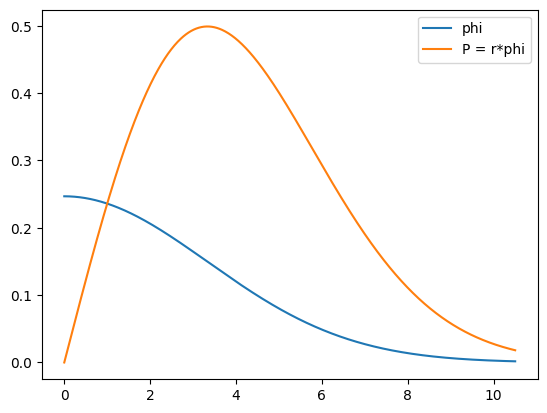

In [3]:
#initialize the variables to the experiment desired
var = variables(table = data, experiment = 1)

a0 = var.a0()  # scattering length in h.o. units
n1 = var.n1()  # number of integration steps in r-grid
step = var.step()  # step size in r-grid
aa = var.aa()   # number of atoms
time = var.time() # timestep
alpha = var.alpha()  # starting parameter of the h.o. function
iter = var.iter()  # number of iterations


#construct the wave function, the P= phi*r function and the linspace of r

initial = initial_construction(var)

R = initial.r_space()
phi_ini = initial.radial_wf()
P_ini = initial.radial_wf_x_r()

plt.plot(R, phi_ini, label='phi')

plt.plot(R, P_ini, label = 'P = r*phi')

plt.legend()

plt.show()

In [4]:
#checking if the simpson integrator works as expected and that the wave function is indeed normalized 

simpson_integration(P_ini**2, step)

0.9998272860135768

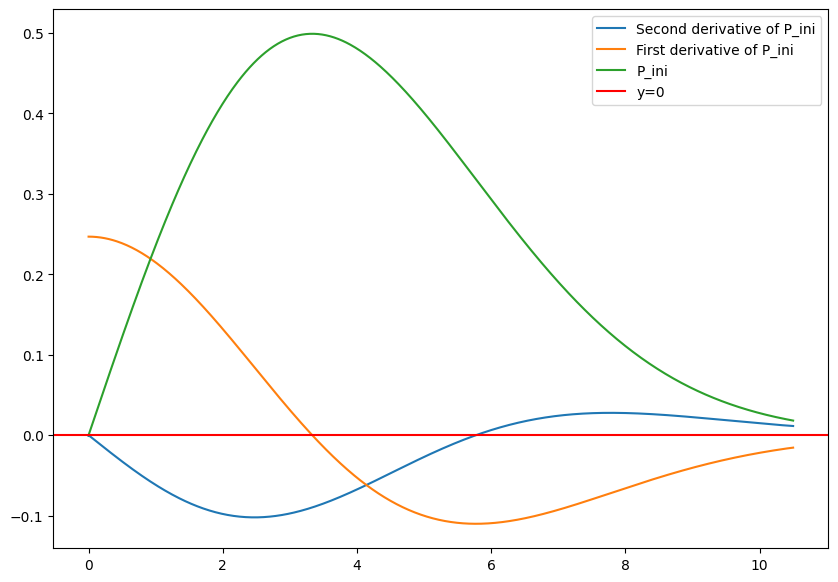

In [5]:
# checking if the first and second derivative functions work as expected

P_ini_second_der = second_derivative(P_ini, step)
P_ini_der = first_derivative(P_ini, step=step)

plt.figure(figsize=(10,7))
plt.plot(R, P_ini_second_der, label = 'Second derivative of P_ini')
plt.plot(R, P_ini_der, label = 'First derivative of P_ini')
plt.plot(R, P_ini, label = 'P_ini')
plt.axhline(y=0, color='r', linestyle='-', label = 'y=0')
plt.legend()
plt.show()

### Observables 

Having checked both integration and derivation functions work as expected, we will now define the funcions we will later use to calculate the different observables of the system. Notice that in this stage of the program we decide whether Thomas-Fermi approximation will be used or not. 

In [6]:
# The following class will be used to calculate the observables of the system given a 
# variables object that contains the info of the experiment, the R*phi function 
# and a boolean thomas_fermi switch that allows to "turn on/off" the kinetic term

class observables:

    def __init__(self, variables, P_function, thomas_fermi = False):
        self.step = variables.step()
        self.a_s = variables.a0()
        self.N_atoms = variables.aa()
        self.n1 = variables.n1()
        self.r = np.linspace(0, variables.n1()*self.step, variables.n1()+1)
        self.P = P_function
        self.tf = thomas_fermi

    def radious2(self):
        radious2 = simpson_integration(f = ((self.P)**2)*((self.r)**2), step = self.step)
        return radious2
    
    def radious(self):
        return np.sqrt(self.radious2())
    
    def harmonic(self):
        harm = simpson_integration(f = ((self.P)**2)*((self.r)**2), step = self.step)
        return 0.5*harm
    
    def interaction(self):
        wf = np.linspace(0, self.n1*self.step, self.n1+1)
        wf[0] = 0
        wf[1:] = self.P[1:]/self.r[1:]
        inter = simpson_integration(f = ((self.r)**2)*((wf)**4), step = self.step)
        return self.a_s*self.N_atoms*0.5*inter
    
    def potential(self):
        return self.interaction() + self.harmonic()
    
    def kinetic(self):
        if self.tf == True:
            kin = 0
        else:
            P_sec_der = second_derivative(self.P, self.step)
            kin = simpson_integration(f = -0.5*self.P*P_sec_der, step = self.step)
        return kin
    
    def total(self):
        return self.kinetic() + self.potential()
    
    def chemical_potential(self):
        h = np.zeros(len(self.r))
        mu = np.zeros(len(self.r))

        if self.tf == False:
            P_sd = second_derivative(self.P, self.step)
            mu[1:] = -0.5*(P_sd[1:]/self.P[1:]) + 0.5*(self.r[1:]**2) + self.a_s*self.N_atoms*(self.P[1:]/self.r[1:])**2
            mu[0] = 0

        else:
            mu[1:] = 0.5*(self.r[1:]**2) + self.a_s*self.N_atoms*(self.P[1:]/self.r[1:])**2
            mu[0] = 0

        return mu
    
    def avg_chemical_potential(self):
        mu = self.chemical_potential()
        avg_mu = simpson_integration(f = mu*(self.P**2), step = self.step)
        return avg_mu
    

##########################################################################################

# Function to calculate the Thomas-Fermi density profile through the according formula
    
def rhoTF(r, chem, a_s, N):
    if chem >= 0.5*r**2:
        return (chem-0.5*r**2)/(4*np.pi*a_s*N)
    else:
        return 0



### Wave function Evolution

The following evolution function is the most important one as it will evolve the initial wave function defined throught the initial_construction class. From the initial state - not an eigen state of the GP equation, we will iterate until reaching the actual ground state of the equation. This is the actual function we will use to calculate the observables of the system.

The evolution function has a switch that allows to select if we want to retrieve the wave function at all steps to plot its full evolution or just the final one. 

In [7]:

#Definition of the evolution function

def evolution(variables, initial_P, keep_evolution = False):
    P = initial_P
    a0 = variables.a0()
    aa = variables.aa()
    step = variables.step()
    n1 = variables.n1()
    iter = variables.iter()
    R = np.linspace(0, n1*step, n1+1)

    if keep_evolution == True:
        # if we want to keep evolution, a matrix wf_evolution is created that stores each step
        wf_evolution = np.zeros((iter, n1+1))

        for i in range(iter):

            # create the h object that serves as the GP operator that will update our wave function
            h = np.zeros(n1+1)
            P_sd = second_derivative(P, step)
            h[1:] = -0.5*(P_sd[1:]/P[1:]) + 0.5*(R[1:]**2) + a0*aa*(P[1:]/R[1:])**2
            h[0] = 0

            # update the wave function --> We have Taylor expanded the evolution operator exp(-iht) to second order
            P2 = P - time*h*P + (time**2)*(h**2)*P/2

            # normalize the wave function and update and store it in the wf_evolution matrix
            P2 = P2/np.sqrt(simpson_integration(P2**2, step))
            P = P2
            P[0] = 0
            wf_evolution[i] = P
        return wf_evolution
    
    elif keep_evolution == False:
        # if we don't want to keep evolution, we just update the wave function iter times and return the final one
        for i in range(iter):
            h = np.zeros(n1+1)
            P_sd = second_derivative(P, step)
            h[1:] = -0.5*(P_sd[1:]/P[1:]) + 0.5*(R[1:]**2) + a0*aa*(P[1:]/R[1:])**2
            h[0] = 0
            P2 = P - time*h*P + (time**2)*(h**2)*P/2
            P2 = P2/np.sqrt(simpson_integration(P2**2, step))
            P = P2
            P[0] = 0
        return P
    
##########################################################################################

#function to plot the evolution of the wave function or just a single profile
def plot_evolution(variables, initial, evolved,  show_evolution = False):
    a0 = variables.a0()
    aa = variables.aa()
    step = variables.step()
    n1 = variables.n1()
    iter = variables.iter()
    R = np.linspace(0, n1*step, n1+1)

    fig = plt.figure(figsize=(10,7))
    
    if show_evolution == True:

        #check that if we want to show evolution the input is the evolved matrix and not just the final step

        assert evolved.shape == (iter, n1+1), 'INCORRECT W_F SHAPE. IF YOU ONLY WANT TO PLOT THE INITIAL AND FINAL STATE TURN SHOW_EVOLUTION TO FALSE'

        axis = plt.axes(xlim = (0, n1*step),
            ylim = (np.min(evolved), np.max(evolved) + 0.05))
        
        line, = axis.plot([],[], lw = 2)

        def init():
            line.set_data([], [])
            return line,

        def animate(i):
            line.set_data(R, evolved[10*i])
            return line,
    
        # call the animation object from matplotlib and close the figure to avoid showint it. At the end we return the animation object
        # in html form to be able to show it in the notebook in an interactive way

        anim = FuncAnimation(fig, animate,
                            init_func = init,
                            frames = 500,
                            interval = 0.5,
                            blit = True)
        plt.close()
        return HTML(anim.to_jshtml(fps=24))
    
        



    elif show_evolution == False:

        # in the case of not showing evolution, we just plot the initial and final state
        # checking first that the input shape is correct
        
        assert evolved.shape == (n1+1, ), 'INCORRECT W_F SHAPE. IF YOU ONLY WANT TO PLOT ALL THE EVOLUTION TURN SHOW_EVOLUTION TO TRUE'

        axis = plt.axes(xlim = (0, n1*step),
            ylim = (np.min(list(evolved)+list(initial)), np.max(list(evolved)+list(initial)) + 0.05))

        plt.plot(R, evolved, label = 'final state')
        plt.plot(R, initial, label = 'initial state')

        plt.legend()
        plt.show()
        

### Plot of the wave function evolution

We can now plot how the Wave function evolves at each step with the evolution funcion. We can see it quickly converges from the initial wave function to the final state.

In [9]:
evolved_wf = evolution(variables=var, initial_P=P_ini, keep_evolution=True)
plot_evolution(variables=var, initial=P_ini, evolved=evolved_wf, show_evolution=True)


## a0) Non interacting case

Before tackling the the interacting case, we first solve the syste without any interaction, which apart from the iterative numerical resolution, also has an analyitical gaussian wave solution, which in harmonic oscillator units read:
$$\bar{\phi(r)} = $$


Aixo ho he d'acabar, perquè no acabo de saber què es l'estat fonamental per l'oscil·lador. A sobre el program colapsa la funció d'ona a 0, que té sentit, però no acabo de saber si això es congruent amb dir que l'estat fonamental és una gaussiana



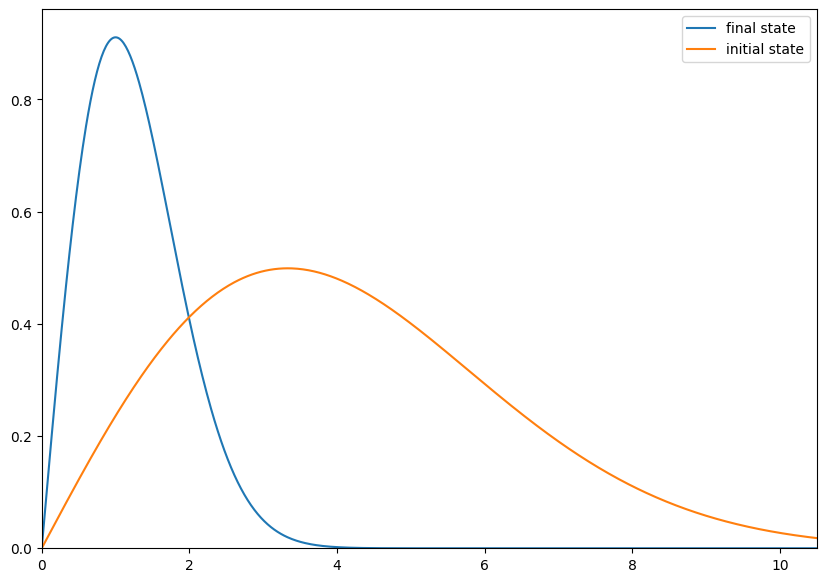

In [21]:
a0_exp = pd.DataFrame({'EXPERIMENT':1, 'A0':0, 'N1':700, 'STEP':0.015, 'AA':1000000, 'TIME':0.00005, 'ALPHA':0.3, 'ITER':70000}, index=[0])
var_exp = variables(table=a0_exp, experiment=1)
initial_exp = initial_construction(var_exp)
P_ini_exp = initial_exp.radial_wf_x_r()
evolved_wf_exp = evolution(variables=var_exp, initial_P=P_ini_exp, keep_evolution=False)
plot_evolution(variables=var_exp, initial=P_ini_exp, evolved=evolved_wf_exp, show_evolution=False)




In this case we see that from the initial construction the particles start collapsing into $r=0$ at a steady pace as it reduces the energy associated to the external harmonic trap an there is no repulsive interaction term to hold the system from falling into the potential well. 

We can also see that the chemical potential is equivalent to the energy per particle. This is due to the fact that since the particles are independent of opne another, the energy required to add or remove a particle from the system is the energy of the particle itself, as it does not depend on N-1 other particles that surround it. In the limit $N\gg1$ where $N \approx N-1$ therefore, the chemical potential, which is in fact this variation of energy of the system when modifying the number of particles, is equal to the energy per particle when removing all interactions. 

## a) Study of the dependende of relevant observables on the number of particles  

In this part of the exercice we want to calcule the chemical potential, the energy of the system and the kinetic, harmonic and interacting terms contributing to it for each experiment. At each experiment the number of particles varies, as well as some of the parameters which are used in the functions defined above such as the number of steps or the iterations of the wave function evolution.

From the table of results we can see the energy of the system grows with the number of particles. This is something you would expect since the interaction term is proportional to $\textit{N}$, and $\textit{E}$ must therefore grow with it. The growth in the chemical potential can also be explained by the interacting term: as the interaction increases with  $\textit{N}$, so does the effect one particle has in the system. The energy necessary to extract one particle becomes then bigger as the number of particle (and the interactions between them) does.

If we now look at the values of the harmonic term, we will see they also increase with the number of particles. This is related to the fact that the "width" of our condensate grows with  $\textit{N}$: as  $\textit{N}$ increases, the probability density becomes "wider", and we have more probabilities of finding a particle in larger values of $\textit{r}$ (we will see this later when we plot the density probability for different  $\textit{N}$). Since the harmonic term depends on $\textit{r}$, it must grow when $\textit{r}$ does.

Finally, we can notice the kinetic term is actually the only term that gets smaller as $\textit{N}$ grows. This is consistent with the fact that, as the number of bosons in the condensate grows, the interaction between them gets stronger, therefore reducing the movement of the particles. This can also be again explained by the density profiles: if the wave function gets wider in  $\textit{r}$, its Fourier's Transformation should then become smaller in $\textit{p}$, reducing the momentum value as $\textit{N}$ increases - this is, reducing its kinetic energy.

In [9]:
#Using a loop, we will calculate the values for E, chemical potential, etc, for all the experiments in 'results'
#In the first place, we will do it without the thomas fermi aproximation


# we start by creating a copy of the data table and extending it to store the observable values for
# each experiment

results = data.copy()

results['μ'] = [0, 0, 0, 0, 0]
results['E'] = [0, 0, 0, 0, 0]
results['T'] = [0, 0, 0, 0, 0]
results['Vh'] = [0, 0, 0, 0, 0]
results['Vi'] = [0, 0, 0, 0, 0]


for i in range(1,6):
    #We start defining the basic parametrs needed for the code
    var = variables(table = data, experiment = i)

    #construct the initial  wave function, the P= phi*r function and the linspace of r
    initial = initial_construction(var)
    P_ini = initial.radial_wf_x_r()

    #We evolve the Wave function to obtain the actual eigen value of the GP equation
    P_fin = evolution(var,P_ini,False)

    #Having evolved the P function, we can calculate the diferent observables and we add them into our results table
    measures3 = observables(variables = var, P_function = P_fin, thomas_fermi= False)
    results.loc[i-1,'μ']= measures3.avg_chemical_potential()
    results.loc[i-1,'E'] = measures3.total()
    results.loc[i-1,'T']= measures3.kinetic()
    results.loc[i-1,'Vh'] = measures3.harmonic()
    results.loc[i-1,'Vi'] = measures3.interaction()

#The final result is
print(results.to_markdown(tablefmt = 'fancy_grid'))

╒════╤══════════════╤═════════╤══════╤════════╤════════════╤════════╤═════════╤════════╤══════════╤══════════╤═══════════╤═══════════╤═══════════╕
│    │   EXPERIMENT │      A0 │   N1 │   STEP │         AA │   TIME │   ALPHA │   ITER │        μ │        E │         T │        Vh │        Vi │
╞════╪══════════════╪═════════╪══════╪════════╪════════════╪════════╪═════════╪════════╪══════════╪══════════╪═══════════╪═══════════╪═══════════╡
│  0 │            1 │ 0.00433 │  700 │  0.015 │      1e+06 │ 5e-05  │     0.3 │  70000 │ 42.1191  │ 30.1201  │ 0.0612037 │ 18.0599   │ 11.999    │
├────┼──────────────┼─────────┼──────┼────────┼────────────┼────────┼─────────┼────────┼──────────┼──────────┼───────────┼───────────┼───────────┤
│  1 │            2 │ 0.00433 │  400 │  0.015 │  10000     │ 0.0001 │     0.8 │  40000 │  6.86661 │  5.04153 │ 0.240542  │  2.97591  │  1.82508  │
├────┼──────────────┼─────────┼──────┼────────┼────────────┼────────┼─────────┼────────┼──────────┼──────────┼────────

## b) Thomas-Fermi approximation

We will now study the behaviour of our Bose Einstein Condensate when we apply the Thomas-Fermi approximation. When we remove the kinetic term, we get that:

$$\bar{\mu}·\overline{\Psi}(\vec{r_{1}})= \left[  \frac{1}{2}r^{2}_{1} +4\pi\bar{a_{s}}N|\overline{\Psi}(\vec{r_{1}})|^{2}\right]· \overline{\Psi}(\vec{r_{1}}).   $$

If we look now at the table of values for the TF approximation, we will see that the kinetic contribution has obviously become 0, and that the qualitative behaviour of the other terms is more or less similar to the one we had seen before. Nevertheless, when comparing both tables, we can check that for $N = 10^{6}$ the energy term is almost the same, while for $N = 100$ the kinetic term has an obvius relevance in its contribution and the final result is clearly different between them.

As we had seen before, the kinetic term is less relevant as $\textit{N}$ increases. Therefore, the TF aproximation becomes more accurate as the number of particles get bigger. 

In [9]:
resultsTF = data.copy()

resultsTF['μ'] = [0, 0, 0, 0, 0]
resultsTF['E'] = [0, 0, 0, 0, 0]
resultsTF['T'] = [0, 0, 0, 0, 0]
resultsTF['Vh'] = [0, 0, 0, 0, 0]
resultsTF['Vi'] = [0, 0, 0, 0, 0]

for i in range(1,6):
    #We start defining the basic parametrs needed for the code
    var = variables(table = data, experiment = i)

    #construct the initial  wave function, the P= phi*r function and the linspace of r
    initial = initial_construction(var)
    P_ini = initial.radial_wf_x_r()

    #We evolve the Wave function to obtain the actual eigen value of the GP equation
    P_fin = evolution(variables=var,initial_P=P_ini,keep_evolution=False)

    #Having evolved the P function, we can calculate the diferent observables and we add them into our resultsTF table
    # by setting thomas_fermi = True in the observables object
    measures3 = observables(variables = var, P_function = P_fin, thomas_fermi= True)
    resultsTF.loc[i-1,'μ']= measures3.avg_chemical_potential()
    resultsTF.loc[i-1,'E'] = measures3.total()
    resultsTF.loc[i-1,'T']= measures3.kinetic() 
    resultsTF.loc[i-1,'Vh'] = measures3.harmonic()
    resultsTF.loc[i-1,'Vi'] = measures3.interaction()

#The final result is
print(resultsTF.to_markdown(tablefmt = 'fancy_grid'))

╒════╤══════════════╤═════════╤══════╤════════╤════════════╤════════╤═════════╤════════╤══════════╤═══════════╤═════╤═══════════╤═══════════╕
│    │   EXPERIMENT │      A0 │   N1 │   STEP │         AA │   TIME │   ALPHA │   ITER │        μ │         E │   T │        Vh │        Vi │
╞════╪══════════════╪═════════╪══════╪════════╪════════════╪════════╪═════════╪════════╪══════════╪═══════════╪═════╪═══════════╪═══════════╡
│  0 │            1 │ 0.00433 │  700 │  0.015 │      1e+06 │ 5e-05  │     0.3 │  70000 │ 42.0579  │ 30.0589   │   0 │ 18.0599   │ 11.999    │
├────┼──────────────┼─────────┼──────┼────────┼────────────┼────────┼─────────┼────────┼──────────┼───────────┼─────┼───────────┼───────────┤
│  1 │            2 │ 0.00433 │  400 │  0.015 │  10000     │ 0.0001 │     0.8 │  40000 │  6.62607 │  4.80099  │   0 │  2.97591  │  1.82508  │
├────┼──────────────┼─────────┼──────┼────────┼────────────┼────────┼─────────┼────────┼──────────┼───────────┼─────┼───────────┼───────────┤
│  2 │

## c) Density profile

Having compared the values for the energy, chemical potential, etc. for the GP solution and the TF approximation, we will then plot the density profiles for the experiments $N = 1000$ and $N = 10^{6}$. 

For the GP solution, we will use the evoluted wave function to calculate $ \rho(\vec{r_{1}}) = |\overline{\varphi}(\vec{r_{1}})|^{2}$.

On the other hand, since the kinetic term is removed, the calculus for the TF approximation is analytical, and we will find ts density profile like:

$$\bar{\mu}= \frac{1}{2}r^{2}_{1} +4\pi\bar{a_{s}}N|\overline{\varphi}(\vec{r_{1}})|^{2} \rightarrow \rho(\vec{r_{1}})_{TF} =\frac{1}{4\pi\bar{a_{s}}N}\left(\bar{\mu}-\frac{1}{2}r^{2}_{1}\right)$$

Which imposes a maximum radius for TF, $ r_{TM} = \sqrt{2\bar{\mu}}$. Imposing the normalization of the wave function, we finally find:

$$ r_{TM} = \left(15\bar{a_{s}}N\right)^{\frac{1}{5}}$$

$$\bar{\mu} = \frac{1}{2} \left(15\bar{a_{s}}N\right)^{\frac{2}{5}} $$

With these results for the GP solution and TF approximation we have plotted the density profiles for the experiments $N = 1000$ and $N = 10^{6}$ below. From these we can learn, like we expected, that the TF approximation improves as $N$ increases. The density profiles get almost identfical similar as $N$ increases - except for $r$ near $r_{TF}$ - , while for a small $N$ there exists an appreciable variation between both profiles in all the range of $r$. 

Also, as we had said in b), we can see how as the number of particle increases, the probability of finding a particle further in $r$ gets bigger - the bose einstein condensate expands as the interaction between bosons increases. In the $N = 1000$, the probability of finding a particle in the center of the condensate is bigger than for $N = 10^{6}$, but it goes to zero way earlier than in the other case.

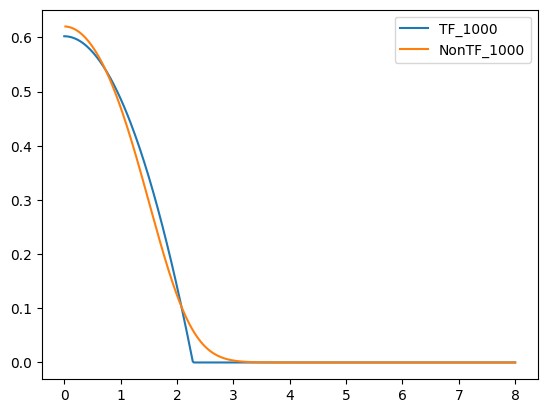

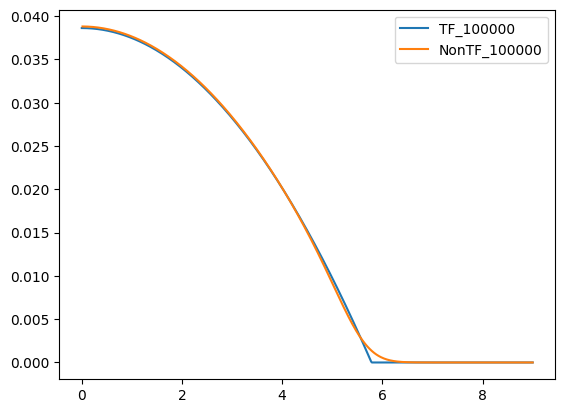

In [13]:

# Having calculated both results for TF and no TF, we want to compare their density for N =1000 and N=100000

# For the TF case, the expression for the wave function is analytical and given by the function rhoTF
# while in the other case, rho is the square modulus of P/r once P has been evoluted.

#N=1000
chem1000 = resultsTF['μ'][3]

#We calculate the evolution of P for our experiment of N=1000
var = variables(table = data, experiment = 4)

#construct the initial  wave function, the P= phi*r function and the linspace of r
initial = initial_construction(var)
R = initial.r_space()
phi_ini = initial.radial_wf()
P_ini = initial.radial_wf_x_r()

#We evolve the Wave function to obtain the actual eigen state of the GP equation
P_1000 = evolution(variables = var, initial_P = P_ini, keep_evolution= False)

#The chemical potential could also be calculated using the analytical expression chem = 0.5*(15*a_s*N)**(2/5)
chem1000 = observables(variables = var, P_function = P_1000, thomas_fermi= True).avg_chemical_potential()

#We plot the results, constructing an array for the TF case
plt.plot(R, [rhoTF(r, chem=chem1000, a_s = var.a0(), N = var.aa()) for r in R], label = 'TF_1000')
plt.plot(R[1:],(P_1000[1:]/R[1:])**2/(4*np.pi), label = 'NonTF_1000')
plt.legend()
plt.show()

# #######################################################################################################

# #N=100000

#We calculate the evolution of P for our experiment
var = variables(table = data, experiment = 3)

#construct the initial  wave function, the P= phi*r function and the linspace of r
initial = initial_construction(var)
R = initial.r_space()
phi_ini = initial.radial_wf()
P_ini = initial.radial_wf_x_r()

#We evolve the Wave function to obtain the actual eigen value of the GP equation
P_100000 = evolution(variables = var, initial_P = P_ini, keep_evolution= False)

chem100000 = observables(variables = var, P_function = P_100000, thomas_fermi= True).avg_chemical_potential()

#We plot the results, again, constructing an array for the TF case
plt.plot(R, [rhoTF(r, chem=chem100000, a_s = var.a0(), N = var.aa()) for r in R], label = 'TF_100000')
plt.plot(R[1:],(P_100000[1:]/R[1:])**2/(4*np.pi), label = 'NonTF_100000')
plt.legend()
plt.show()

## d) Virial Theorem

Lastly, we will check the accuracy with wich the Virial Theorem is fulfilled. For our Bose Einstein condensate, Virial Theorem tells us:

$$ 2·e_{kin} - 2·e_{ho} + 3·e_{int}=0. $$

In the next table we have calculated  $2·e_{kin} - 2·e_{ho} + 3·e_{int}$  for every experiment with the results found in b). Again, we see how the results get closer to 0 as $N$ increases. This is expected if we take into account that the mean-field aproximation we had stated at the beggining of this work improves as N increases, aswell the assumption $ N  \approx N-1$.


In [42]:
#Finally, We want to check the viral theorem
#For this case, it states that 2*T+3*Vi-2*Vh = 0
TableVirialNoTF = [['1000000','10000','100000', '10000','1000'],[0,0,0,0,0]]
for i in range(1,6):
    TableVirialNoTF[1][i-1] = 2*TableTF[i][3] + 3*TableTF[i][5] -2*TableTF[i][4]

print(tabulate(TableVirialNoTF, headers = 'firstrow',tablefmt='fancy_grid'))

# As N increases, the mean field approximation becomes better and the viral theorem is more accurate

╒═══════════╤═══════════╤═══════════╤═══════════╤══════════╕
│   1000000 │     10000 │    100000 │     10000 │     1000 │
╞═══════════╪═══════════╪═══════════╪═══════════╪══════════╡
│ -0.122728 │ -0.480709 │ -0.247338 │ -0.874982 │ -1.31295 │
╘═══════════╧═══════════╧═══════════╧═══════════╧══════════╛
